In [1]:
import pandas as pd
import os

In [2]:
os.chdir("/mnt/c/Users/diego/OneDrive/Documentos/Data science projects/nlp 2/petsentiment_analysis")

In [3]:
data = pd.read_parquet("data/processed/train_data1.parquet")

In [6]:
data.head()

,rating,text,asin,user_id,timestamp,Sentiment_target,word_count,processed_text
0,2.0,When I bought this I thought it would be effec...,B075N83693,AFASI57RME5JYIZMK2DOSMXVNFCA,2023-01-04 18:24:55.647000+00:00,0,96,buy think effective cut dog nail hate paw touc...
1,4.0,Says it holds 35 lbs but my 31 lb bag of food ...,B002Q7SZ2A,AEIHJFJYIR4GRY6UZK65LJU2NUVA,2023-03-15 03:19:27.473000+00:00,1,15,say hold lbs lb bag food not fit
2,2.0,I was hopeful that this would solve the trick ...,B07KRGVBCD,AEYB5YOWHB7V72J3EG4IF6LVZL4A,2023-01-25 17:50:59.419000+00:00,0,42,hopeful solve trick plastic get chew dog plast...
3,5.0,"Had to have this, even before I have the kitty...",B0BKL1V8L9,AFOZLZHEHJQDFX5XAFD7A4JWNIWA,2023-02-25 22:43:19.764000+00:00,1,23,kitty cute extremely pleased quality need
4,5.0,Perfect for my elderly cat who has an occasion...,B09QTTYLD5,AHXPT5Q4HABHQ7P24Y7SRJISFJKQ,2023-06-25 00:02:14.844000+00:00,1,34,perfect elderly cat occasional accident not mi...


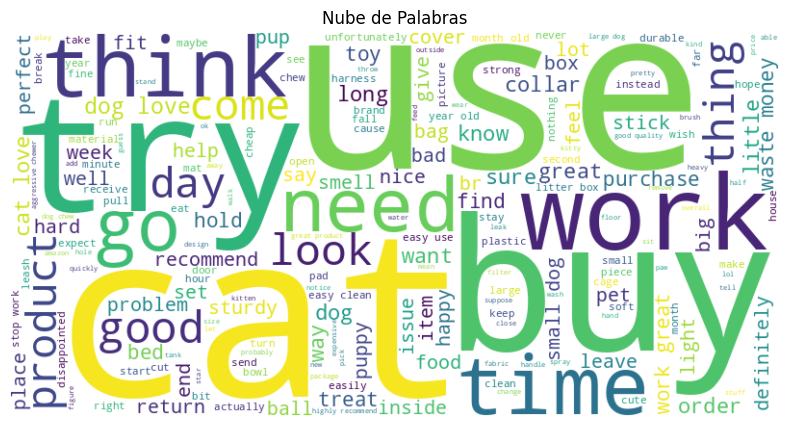

In [7]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Cargar tus datos
# df = pd.read_parquet('ruta/a/tu/archivo.parquet')  # Descomenta y ajusta la ruta a tu archivo

# Unir todos los textos procesados en una sola cadena
text = ' '.join(data['processed_text'])

# Crear la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=200).generate(text)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Ocultar los ejes
plt.title('Nube de Palabras')
plt.show()


In [20]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

# Cargar los archivos de entrenamiento y prueba
train_df = pd.read_parquet("data/processed/train_data.parquet")  # Ajusta la ruta a tu archivo de entrenamiento
test_df = pd.read_parquet("data/processed/test_data.parquet")      # Ajusta la ruta a tu archivo de prueba

# Dividir en características y etiquetas
X_train = train_df['processed_text']  # Texto procesado
y_train = train_df['Sentiment_target']  # Etiquetas de sentimiento

X_test = test_df['processed_text']      # Texto procesado de prueba
y_test = test_df['Sentiment_target']     # Etiquetas de sentimiento de prueba

# Vectorizar el texto utilizando TF-IDF
vectorizer = TfidfVectorizer(max_features=5000)  # Puedes ajustar max_features según sea necesario
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Entrenar modelo de Naive Bayes
nb_model = MultinomialNB()
nb_model.fit(X_train_tfidf, y_train)

# Predecir con el modelo de Naive Bayes
y_pred_nb = nb_model.predict(X_test_tfidf)

# Evaluar el modelo de Naive Bayes
print("Naive Bayes:")
print("Accuracy:", accuracy_score(y_test, y_pred_nb))
print(classification_report(y_test, y_pred_nb))

# Entrenar modelo de XGBoost
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train_tfidf, y_train)

# Predecir con el modelo de XGBoost
y_pred_xgb = xgb_model.predict(X_test_tfidf)

# Evaluar el modelo de XGBoost
print("\nXGBoost:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))


Naive Bayes:
Accuracy: 0.8164766042175763
              precision    recall  f1-score   support

           0       0.82      0.83      0.82     22666
           1       0.81      0.81      0.81     21530

    accuracy                           0.82     44196
   macro avg       0.82      0.82      0.82     44196
weighted avg       0.82      0.82      0.82     44196



/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [18:05:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost:
Accuracy: 0.8217033215675627
              precision    recall  f1-score   support

           0       0.81      0.86      0.83     22666
           1       0.84      0.79      0.81     21530

    accuracy                           0.82     44196
   macro avg       0.82      0.82      0.82     44196
weighted avg       0.82      0.82      0.82     44196



/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_54246/3543010523.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sample_data = data.groupby('Sentiment_target', group_keys=False).apply(



Generando embeddings con TFIDF...


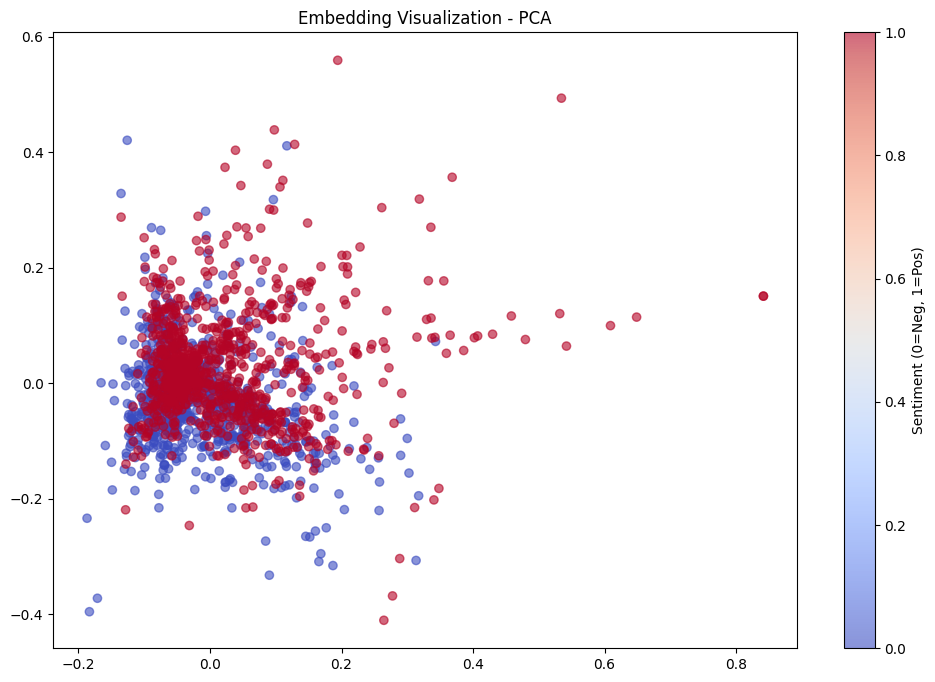

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


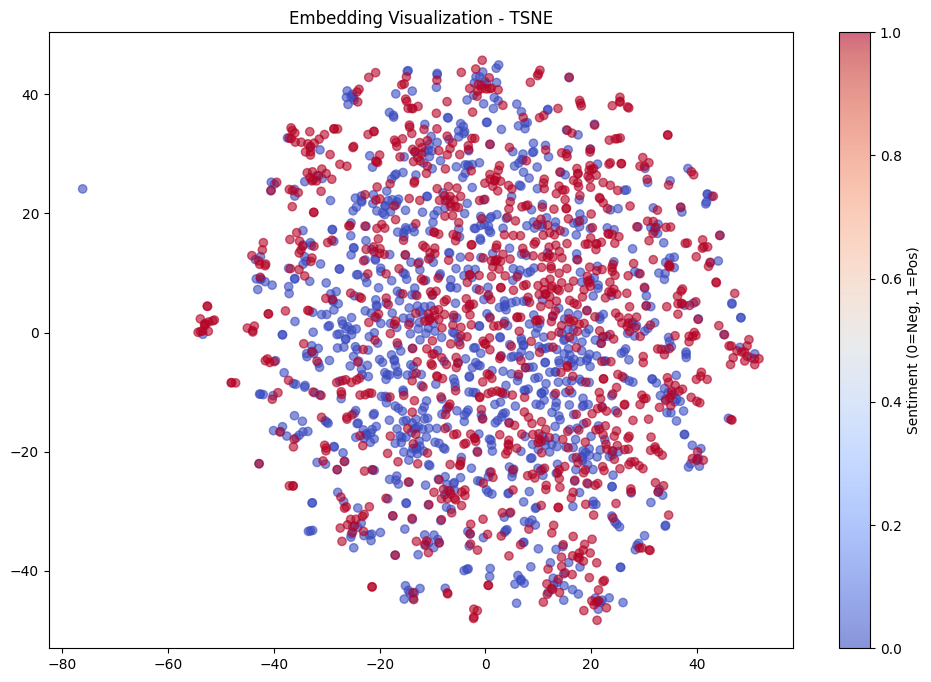

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


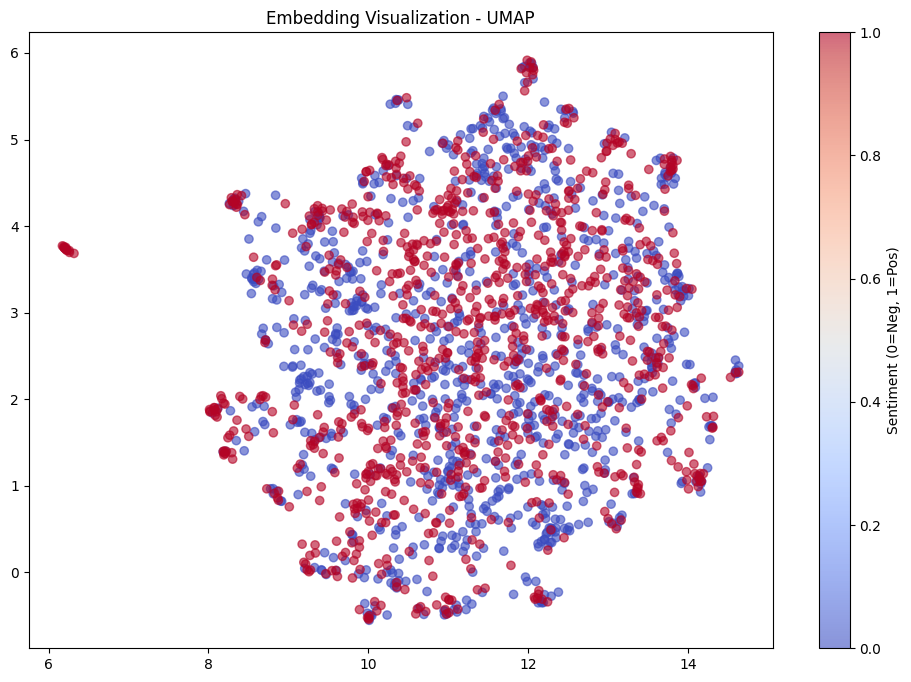


Generando embeddings con SPACY...


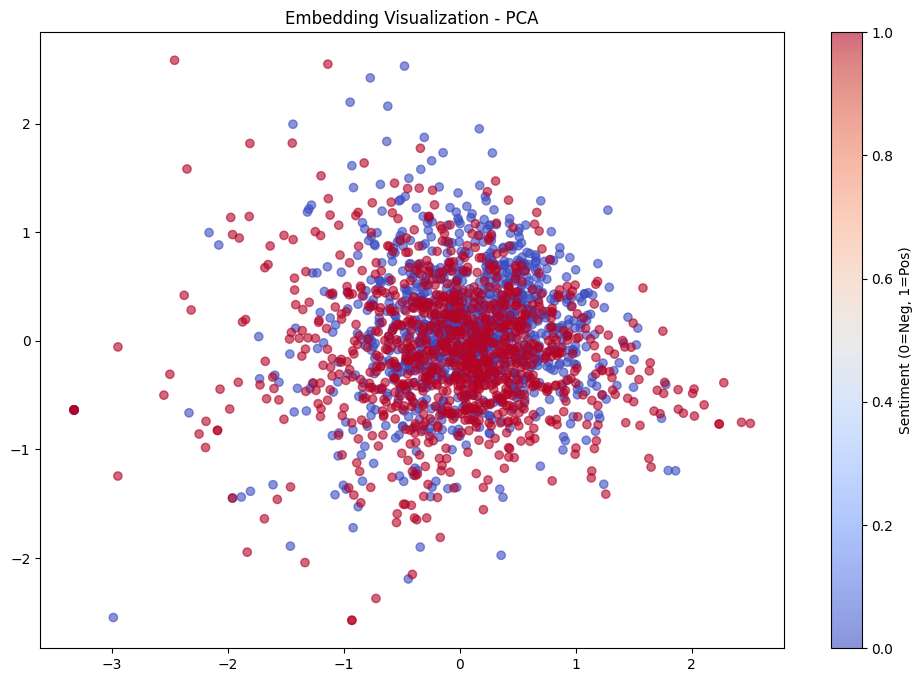

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



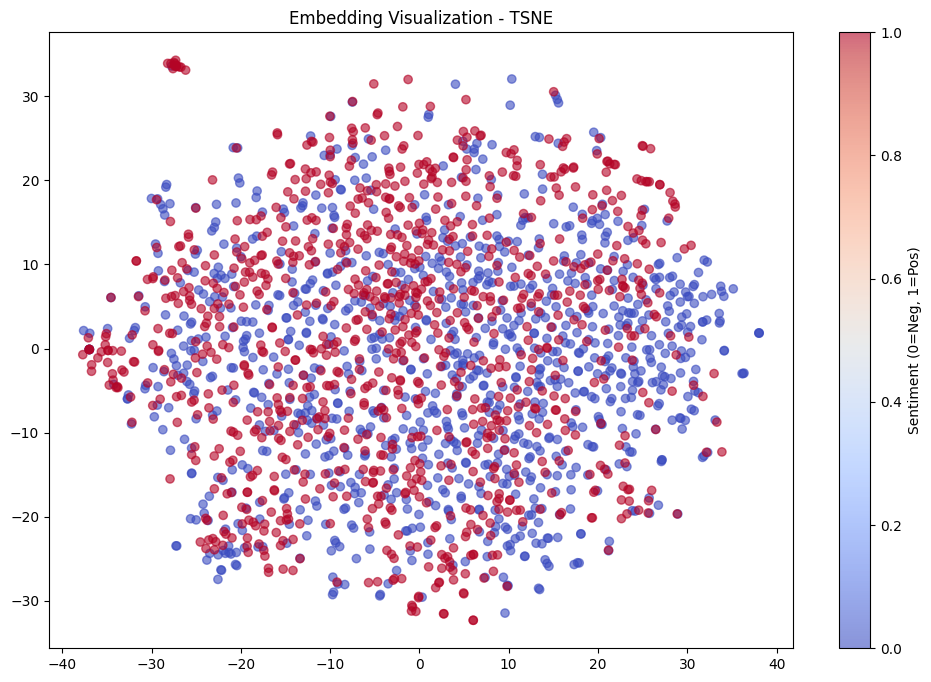

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



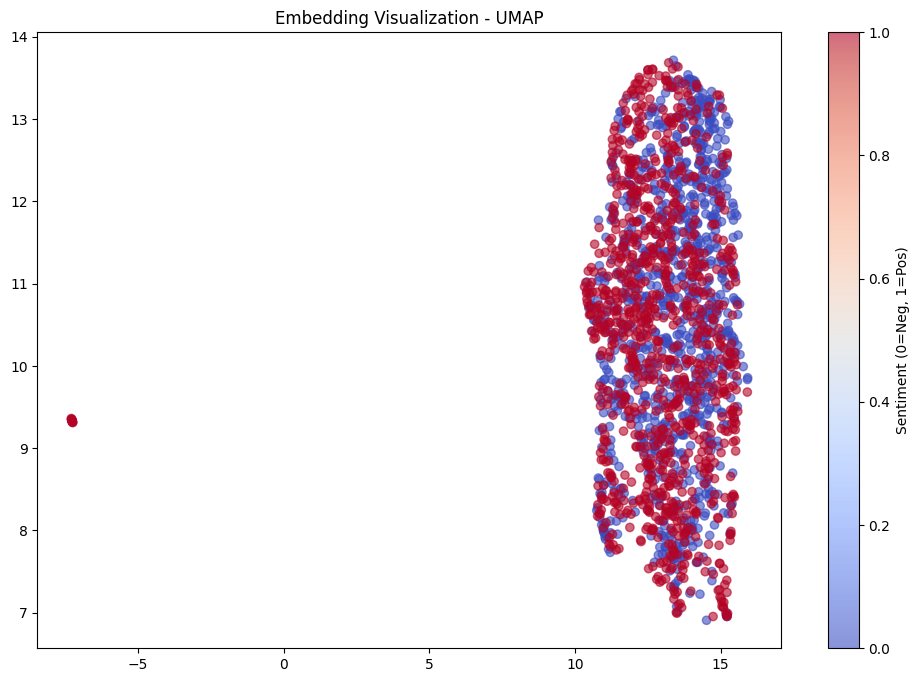


Generando embeddings con TRANSFORMER...


Batches: 100%|██████████| 63/63 [00:03<00:00, 15.82it/s]


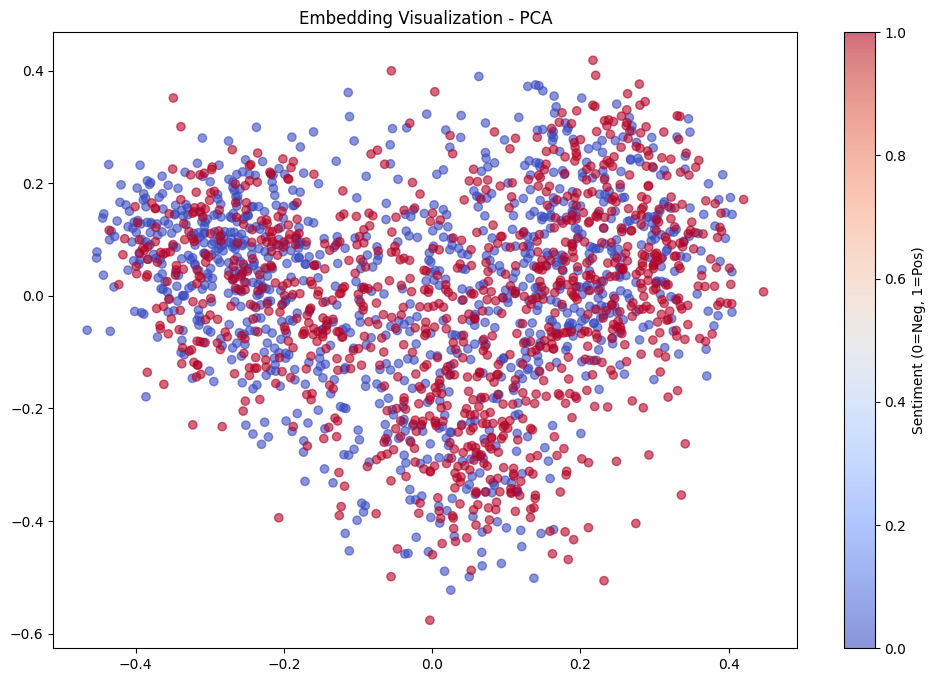

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



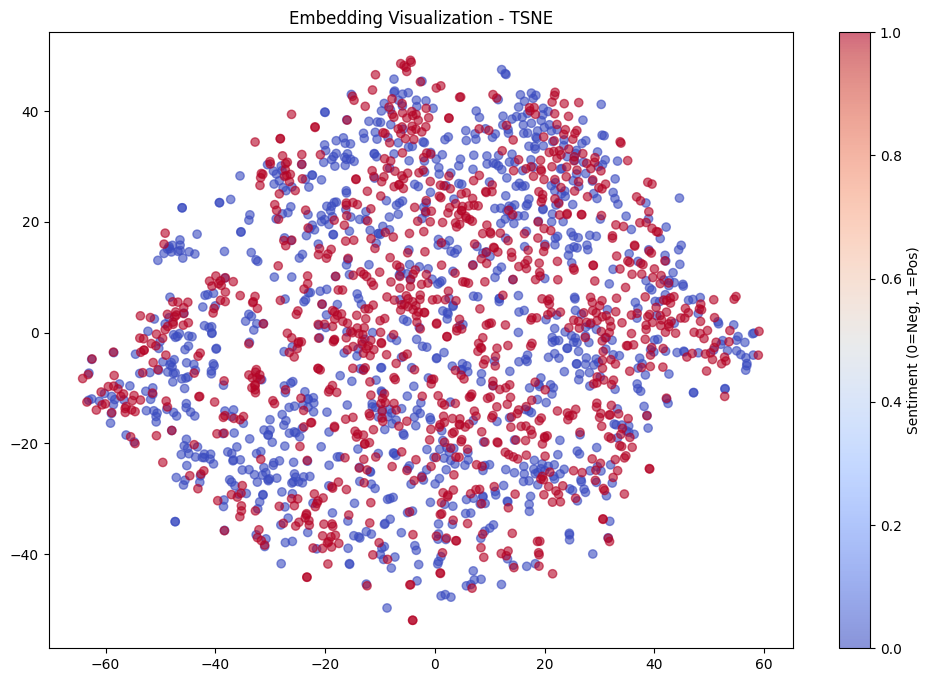

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



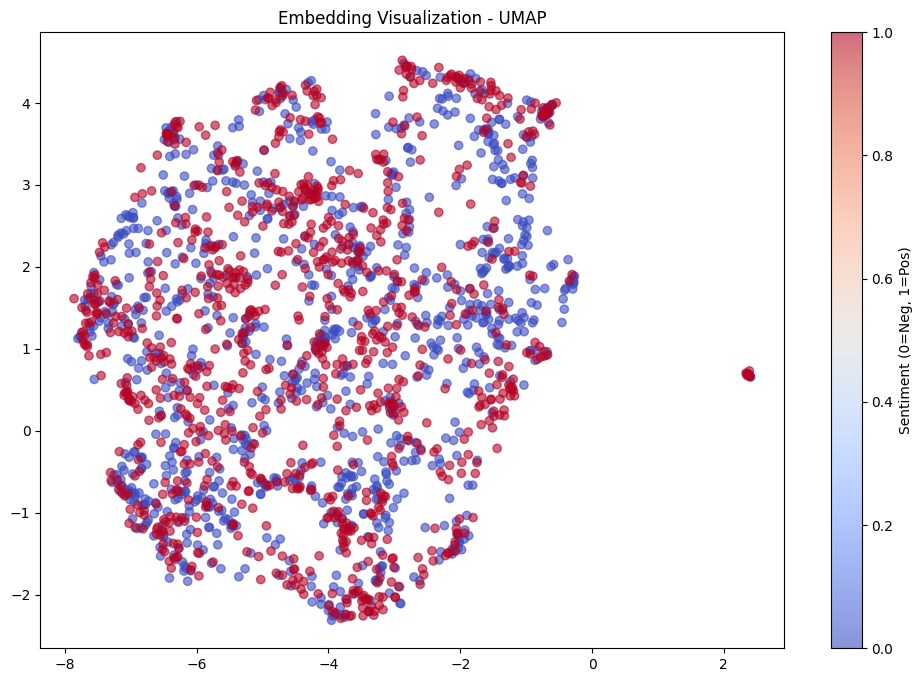

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap.umap_ import UMAP
from sklearn.feature_extraction.text import TfidfVectorizer
import plotly.express as px
import spacy
import pandas as pd

# 1. Cargar datos procesados
train_data = pd.read_parquet("data/processed/train_data.parquet")

# 2. Muestreo estratificado y preparación de datos
def prepare_samples(data):
    # Muestreo estratificado
    sample_data = data.groupby('Sentiment_target', group_keys=False).apply(
        lambda x: x.sample(1000, random_state=42)
    )
    
    # Resetear índices y filtrar textos vacíos
    sample_data = sample_data.reset_index(drop=True)
    sample_data = sample_data[sample_data['processed_text'].str.len() > 0].copy()
    
    return sample_data

# 3. Generación de embeddings (3 métodos)
def generate_embeddings(texts, method='tfidf'):
    if method == 'tfidf':
        vectorizer = TfidfVectorizer(max_features=5000)
        return vectorizer.fit_transform(texts).toarray()
    
    elif method == 'spacy':
        nlp = spacy.load("en_core_web_md")
        return np.array([nlp(text).vector for text in texts])
    
    elif method == 'transformer':
        from sentence_transformers import SentenceTransformer
        model = SentenceTransformer('all-mpnet-base-v2')
        return model.encode(texts, show_progress_bar=True)

# 4. Reducción dimensional comparativa
def visualize_embeddings(embeddings, labels, method='PCA'):
    if method == 'PCA':
        reducer = PCA(n_components=2)
    elif method == 'TSNE':
        reducer = TSNE(n_components=2, perplexity=30, n_iter=1000)
    elif method == 'UMAP':
        reducer = UMAP(n_components=2, n_neighbors=15)
    
    reduced = reducer.fit_transform(embeddings)
    
    plt.figure(figsize=(12, 8))
    plt.scatter(reduced[:, 0], reduced[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
    plt.title(f'Embedding Visualization - {method}')
    plt.colorbar(label='Sentiment (0=Neg, 1=Pos)')
    plt.show()

# 5. Visualización 3D interactiva
def interactive_3d_visualization(embeddings, labels, texts):
    pca_3d = PCA(n_components=3)
    reduced_3d = pca_3d.fit_transform(embeddings)
    
    df_plot = pd.DataFrame({
        'x': reduced_3d[:, 0],
        'y': reduced_3d[:, 1],
        'z': reduced_3d[:, 2],
        'sentiment': labels,
        'text': texts  # Usamos los textos ya filtrados
    })
    
    fig = px.scatter_3d(df_plot, x='x', y='y', z='z', color='sentiment',
                        hover_data=['text'], color_continuous_scale=px.colors.sequential.Viridis)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

# Pipeline principal
def embedding_analysis():
    sample_data = prepare_samples(train_data)
    methods = ['tfidf', 'spacy', 'transformer']
    
    for method in methods:
        print(f"\nGenerando embeddings con {method.upper()}...")
        
        # Obtener textos limpios
        texts = sample_data['processed_text'].tolist()
        labels = sample_data['Sentiment_target'].values
        
        # Generar embeddings
        embeddings = generate_embeddings(texts, method)
        
        # Validar dimensiones
        assert len(embeddings) == len(labels) == len(texts), "¡Datos desalineados!"
        
        # Visualización 2D
        for reduction in ['PCA', 'TSNE', 'UMAP']:
            visualize_embeddings(embeddings, labels, reduction)
        
        # Visualización 3D interactiva
        interactive_3d_visualization(embeddings, labels, texts)

# Ejecutar análisis
embedding_analysis()

In [12]:
import torch
import umap
import plotly.express as px
import pandas as pd
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from tqdm import tqdm

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"  # Cambia a "bert-base-uncased" si prefieres BERT
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME)

# Cargar dataset y tomar una muestra de 5000 datos
df_sample = data.sample(n=5000, random_state=42).reset_index(drop=True)

# Parámetros para procesamiento eficiente
BATCH_SIZE = 6  # Ajustar según la memoria disponible
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Función para obtener embeddings en lotes
def get_embeddings(texts, batch_size=16):
    all_embeddings = []
    model.eval()
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Procesando lotes"):
            batch_texts = texts[i:i + batch_size].tolist()
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt", max_length=128)
            inputs = {k: v.to(device) for k, v in inputs.items()}  # Enviar a GPU si disponible
            outputs = model(**inputs)
            batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Extraer el token [CLS]
            all_embeddings.extend(batch_embeddings)
    return all_embeddings

# Obtener embeddings con batch processing
embeddings = get_embeddings(df_sample["text"], BATCH_SIZE)

# Normalizar los embeddings
scaled_embeddings = StandardScaler().fit_transform(embeddings)

# Aplicar PCA antes de UMAP
pca = PCA(n_components=50, random_state=42)
pca_embeddings = pca.fit_transform(scaled_embeddings)

# Reducir dimensionalidad con UMAP
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
low_dim_embeddings = reducer.fit_transform(pca_embeddings)

# Crear DataFrame para visualización
df_umap = pd.DataFrame(low_dim_embeddings, columns=["Dim 1", "Dim 2"])
df_umap["Sentiment_target"] = df_sample["Sentiment_target"].astype(str)

# Visualización con Plotly
fig = px.scatter(df_umap, x="Dim 1", y="Dim 2", color="Sentiment_target",
                 title="Visualización de Embeddings con BERT/RoBERTa (PCA + UMAP)",
                 template="plotly_dark", opacity=0.7)

fig.update_traces(marker=dict(size=4))
fig.show()



Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Procesando lotes: 100%|██████████| 834/834 [00:23<00:00, 35.39it/s]
/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [5]:
import torch
import umap
import plotly.express as px
import pandas as pd
import re
import joblib
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
from tqdm import tqdm

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME)

# Cargar dataset y tomar una muestra de 5000 datos
df_sample = data.sample(n=10000, random_state=42).reset_index(drop=True)

# Función para limpiar texto (sin lematización ni stopwords)
def clean_text(text):
    text = text.lower()  # Convertir a minúsculas
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Eliminar caracteres especiales
    text = re.sub(r"\s+", " ", text).strip()  # Eliminar espacios extra
    return text

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Parámetros para procesamiento eficiente
BATCH_SIZE = 6
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Función para obtener embeddings en lotes
def get_embeddings(texts, batch_size=16):
    all_embeddings = []
    model.eval()
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Procesando lotes"):
            batch_texts = texts[i:i + batch_size].tolist()
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt", max_length=128)
            inputs = {k: v.to(device) for k, v in inputs.items()}
            outputs = model(**inputs)
            batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Extraer el token [CLS]
            all_embeddings.extend(batch_embeddings)
    return all_embeddings

# Obtener embeddings con batch processing
embeddings = get_embeddings(df_sample["cleaned_text"], BATCH_SIZE)

# Guardar embeddings en un CSV
df_embeddings = pd.DataFrame(embeddings)
df_embeddings["Sentiment_target"] = df_sample["Sentiment_target"]
df_embeddings.to_csv("embeddings.csv", index=False)

# Normalizar embeddings
scaled_embeddings = StandardScaler().fit_transform(embeddings)

# Aplicar PCA antes de UMAP
pca = PCA(n_components=50, random_state=42)
pca_embeddings = pca.fit_transform(scaled_embeddings)

# Reducir dimensionalidad con UMAP
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
low_dim_embeddings = reducer.fit_transform(pca_embeddings)

# Crear DataFrame para visualización
df_umap = pd.DataFrame(low_dim_embeddings, columns=["Dim 1", "Dim 2"])
df_umap["Sentiment_target"] = df_sample["Sentiment_target"].astype(str)

# Visualización con Plotly
fig = px.scatter(df_umap, x="Dim 1", y="Dim 2", color="Sentiment_target",
                 title="Visualización de Embeddings con BERT/RoBERTa (PCA + UMAP)",
                 template="plotly_dark", opacity=0.7)
fig.update_traces(marker=dict(size=4))
fig.show()

# Entrenar modelos con los embeddings generados
X = scaled_embeddings
y = df_sample["Sentiment_target"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo XGBoost
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42)
xgb_model.fit(X_train, y_train)
joblib.dump(xgb_model, "xgboost_model.pkl")

# Modelo Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
joblib.dump(nb_model, "naive_bayes_model.pkl")

# Evaluación de modelos
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"\nResultados de {model_name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, y_pred))

# Evaluar XGBoost
evaluate_model(xgb_model, X_test, y_test, "XGBoost")

# Evaluar Naive Bayes
evaluate_model(nb_model, X_test, y_test, "Naive Bayes")

print("Modelos evaluados con éxito.")


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Procesando lotes: 100%|██████████| 1667/1667 [00:43<00:00, 38.28it/s]
/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[16:43:58] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





Resultados de XGBoost:
Accuracy: 0.8450
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      1030
           1       0.85      0.82      0.84       970

    accuracy                           0.84      2000
   macro avg       0.85      0.84      0.84      2000
weighted avg       0.85      0.84      0.84      2000


Resultados de Naive Bayes:
Accuracy: 0.7905
              precision    recall  f1-score   support

           0       0.78      0.82      0.80      1030
           1       0.80      0.76      0.78       970

    accuracy                           0.79      2000
   macro avg       0.79      0.79      0.79      2000
weighted avg       0.79      0.79      0.79      2000

Modelos evaluados con éxito.


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import umap
import plotly.express as px
import pandas as pd
import re
import joblib
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
from tqdm import tqdm

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME).to(device)

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=10000, random_state=42).reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = text.lower()  # Convertir a minúsculas
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Eliminar caracteres especiales
    text = re.sub(r"\s+", " ", text).strip()  # Eliminar espacios extra
    return text

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Función para obtener embeddings en lotes
def get_embeddings(texts, batch_size=16):
    all_embeddings = []
    model.eval()
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Procesando lotes"):
            batch_texts = texts[i:i + batch_size].tolist()
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt", max_length=128)
            inputs = {k: v.to(device) for k, v in inputs.items()}
            outputs = model(**inputs)
            batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Extraer el token [CLS]
            all_embeddings.extend(batch_embeddings)
    return all_embeddings

# Obtener embeddings
embeddings = get_embeddings(df_sample["cleaned_text"], batch_size=6)

# Normalizar embeddings
scaled_embeddings = StandardScaler().fit_transform(embeddings)

# División en train y test
X_train, X_test, y_train, y_test = train_test_split(scaled_embeddings, df_sample["Sentiment_target"], test_size=0.2, random_state=42)

# Convertir a tensores
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

# Definir la red neuronal
class SentimentClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SentimentClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)
        self.softmax = nn.Softmax(dim=1)  # Activación para clasificación multiclase

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return self.softmax(x)

# Parámetros de la red
input_dim = X_train.shape[1]
hidden_dim = 128
output_dim = len(df_sample["Sentiment_target"].unique())

# Inicializar modelo
model_nn = SentimentClassifier(input_dim, hidden_dim, output_dim).to(device)

# Definir pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_nn.parameters(), lr=0.001)

# Entrenamiento
epochs = 20
batch_size = 32
num_samples = X_train_tensor.shape[0]

for epoch in range(epochs):
    model_nn.train()
    epoch_loss = 0
    correct = 0
    
    for i in range(0, num_samples, batch_size):
        X_batch = X_train_tensor[i:i+batch_size]
        y_batch = y_train_tensor[i:i+batch_size]

        optimizer.zero_grad()
        outputs = model_nn(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        correct += (outputs.argmax(dim=1) == y_batch).sum().item()
    
    accuracy = correct / num_samples
    print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}, Accuracy: {accuracy:.4f}")

# Evaluación en test
model_nn.eval()
with torch.no_grad():
    y_pred_test = model_nn(X_test_tensor).argmax(dim=1)
    test_accuracy = accuracy_score(y_test.cpu(), y_pred_test.cpu())

print(f"\nAccuracy en test: {test_accuracy:.4f}")
print(classification_report(y_test.cpu(), y_pred_test.cpu()))

# Guardar modelo
torch.save(model_nn.state_dict(), "sentiment_nn_model.pth")

print("Entrenamiento de red neuronal finalizado con éxito.")


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Procesando lotes: 100%|██████████| 1667/1667 [00:42<00:00, 38.89it/s]


Epoch 1/20, Loss: 118.3566, Accuracy: 0.8334
Epoch 2/20, Loss: 109.6750, Accuracy: 0.8702
Epoch 3/20, Loss: 105.7350, Accuracy: 0.8902
Epoch 4/20, Loss: 102.4665, Accuracy: 0.9038
Epoch 5/20, Loss: 100.2544, Accuracy: 0.9130
Epoch 6/20, Loss: 98.7652, Accuracy: 0.9184
Epoch 7/20, Loss: 97.3539, Accuracy: 0.9246
Epoch 8/20, Loss: 96.8694, Accuracy: 0.9256
Epoch 9/20, Loss: 96.2412, Accuracy: 0.9293
Epoch 10/20, Loss: 95.6062, Accuracy: 0.9314
Epoch 11/20, Loss: 95.6181, Accuracy: 0.9311
Epoch 12/20, Loss: 94.9567, Accuracy: 0.9327
Epoch 13/20, Loss: 94.2609, Accuracy: 0.9373
Epoch 14/20, Loss: 93.6501, Accuracy: 0.9386
Epoch 15/20, Loss: 93.5744, Accuracy: 0.9389
Epoch 16/20, Loss: 92.8218, Accuracy: 0.9417
Epoch 17/20, Loss: 92.3997, Accuracy: 0.9439
Epoch 18/20, Loss: 92.4316, Accuracy: 0.9441
Epoch 19/20, Loss: 92.2953, Accuracy: 0.9449
Epoch 20/20, Loss: 91.8443, Accuracy: 0.9467


AttributeError: 'Series' object has no attribute 'cpu'

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import umap
import plotly.express as px
import pandas as pd
import re
import joblib
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
from tqdm import tqdm

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME).to(device)

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=50000, random_state=42).reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = text.lower()  # Convertir a minúsculas
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Eliminar caracteres especiales
    text = re.sub(r"\s+", " ", text).strip()  # Eliminar espacios extra
    return text

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Función para obtener embeddings en lotes
def get_embeddings(texts, batch_size=16):
    all_embeddings = []
    model.eval()
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Procesando lotes"):
            batch_texts = texts[i:i + batch_size].tolist()
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt", max_length=128)
            inputs = {k: v.to(device) for k, v in inputs.items()}
            outputs = model(**inputs)
            batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Extraer el token [CLS]
            all_embeddings.extend(batch_embeddings)
    return all_embeddings

# Obtener embeddings
embeddings = get_embeddings(df_sample["cleaned_text"], batch_size=6)

# Normalizar embeddings
scaled_embeddings = StandardScaler().fit_transform(embeddings)

# División en train y test
X_train, X_test, y_train, y_test = train_test_split(scaled_embeddings, df_sample["Sentiment_target"], test_size=0.2, random_state=42)

# Convertir a tensores
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

# Definir la red neuronal
class SentimentClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SentimentClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)
        self.softmax = nn.Softmax(dim=1)  # Activación para clasificación multiclase

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return self.softmax(x)

# Parámetros de la red
input_dim = X_train.shape[1]
hidden_dim = 128
output_dim = len(df_sample["Sentiment_target"].unique())

# Inicializar modelo
model_nn = SentimentClassifier(input_dim, hidden_dim, output_dim).to(device)

# Definir pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_nn.parameters(), lr=0.001)

# Entrenamiento
epochs = 20
batch_size = 32
num_samples = X_train_tensor.shape[0]

for epoch in range(epochs):
    model_nn.train()
    epoch_loss = 0
    correct = 0
    
    for i in range(0, num_samples, batch_size):
        X_batch = X_train_tensor[i:i+batch_size]
        y_batch = y_train_tensor[i:i+batch_size]

        optimizer.zero_grad()
        outputs = model_nn(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        correct += (outputs.argmax(dim=1) == y_batch).sum().item()
    
    accuracy = correct / num_samples
    print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}, Accuracy: {accuracy:.4f}")


# Evaluación en test
model_nn.eval()
with torch.no_grad():
    y_pred_test = model_nn(X_test_tensor).argmax(dim=1)
    # Convertir tensores a numpy arrays para sklearn
    test_accuracy = accuracy_score(
        y_test_tensor.cpu().numpy(),  # Usar el tensor convertido
        y_pred_test.cpu().numpy()
    )

print(f"\nAccuracy en test: {test_accuracy:.4f}")
print(classification_report(
    y_test_tensor.cpu().numpy(),  # Usar el tensor convertido
    y_pred_test.cpu().numpy()
))

# Guardar modelo
torch.save(model_nn.state_dict(), "sentiment_nn_model.pth")

print("Entrenamiento de red neuronal finalizado con éxito.")

cuda


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Procesando lotes: 100%|██████████| 8334/8334 [04:13<00:00, 32.92it/s]


Epoch 1/20, Loss: 560.2606, Accuracy: 0.8591
Epoch 2/20, Loss: 541.5531, Accuracy: 0.8755
Epoch 3/20, Loss: 531.8366, Accuracy: 0.8842
Epoch 4/20, Loss: 526.0866, Accuracy: 0.8899
Epoch 5/20, Loss: 520.2065, Accuracy: 0.8952
Epoch 6/20, Loss: 515.6841, Accuracy: 0.8985
Epoch 7/20, Loss: 512.0851, Accuracy: 0.9016
Epoch 8/20, Loss: 508.2128, Accuracy: 0.9047
Epoch 9/20, Loss: 505.0026, Accuracy: 0.9078
Epoch 10/20, Loss: 503.5764, Accuracy: 0.9097
Epoch 11/20, Loss: 500.8481, Accuracy: 0.9115
Epoch 12/20, Loss: 500.0660, Accuracy: 0.9117
Epoch 13/20, Loss: 496.7699, Accuracy: 0.9147
Epoch 14/20, Loss: 494.6548, Accuracy: 0.9168
Epoch 15/20, Loss: 493.2717, Accuracy: 0.9179
Epoch 16/20, Loss: 494.5965, Accuracy: 0.9162
Epoch 17/20, Loss: 490.4685, Accuracy: 0.9199
Epoch 18/20, Loss: 492.1837, Accuracy: 0.9185
Epoch 19/20, Loss: 489.5732, Accuracy: 0.9209
Epoch 20/20, Loss: 485.3877, Accuracy: 0.9245

Accuracy en test: 0.8683
              precision    recall  f1-score   support

        

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import re
import joblib
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
import numpy as np

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME).to(device)

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=50000, random_state=42).reset_index(drop=True)

# Función para limpiar texto (mejorada)
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Mantener caracteres especiales en español
    text = re.sub(r"\s+", " ", text).strip()
    return text[:512]  # Limitar longitud máxima

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Función para obtener embeddings (optimizada)
def get_embeddings(texts, batch_size=16):
    model.eval()
    all_embeddings = []
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Procesando lotes"):
            batch = texts[i:i+batch_size].tolist()
            inputs = tokenizer(
                batch, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(device)
            
            outputs = model(**inputs)
            embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()
            all_embeddings.append(embeddings)
    return np.concatenate(all_embeddings, axis=0)

# Obtener embeddings
embeddings = get_embeddings(df_sample["cleaned_text"], batch_size=8)

# Normalización mejorada
scaler = StandardScaler()
scaled_embeddings = scaler.fit_transform(embeddings)

# División en train y test (con stratify)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_embeddings, 
    df_sample["Sentiment_target"], 
    test_size=0.2, 
    random_state=42,
    stratify=df_sample["Sentiment_target"]  # Mejor balance de clases
)

# Conversión a tensores (optimizada)
train_dataset = TensorDataset(
    torch.tensor(X_train, dtype=torch.float32),
    torch.tensor(y_train.values, dtype=torch.long)
)
test_dataset = TensorDataset(
    torch.tensor(X_test, dtype=torch.float32),
    torch.tensor(y_test.values, dtype=torch.long)  # Corrección clave aquí
)

# DataLoader para entrenamiento más eficiente
BATCH_SIZE = 64
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

# Modelo mejorado
class SentimentClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.Dropout(0.3),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim//2),
            nn.BatchNorm1d(hidden_dim//2),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(hidden_dim//2, output_dim)
        )
        
    def forward(self, x):
        return self.net(x)

# Parámetros mejorados
input_dim = X_train.shape[1]
hidden_dim = 256
output_dim = len(df_sample["Sentiment_target"].unique())

model_nn = SentimentClassifier(input_dim, hidden_dim, output_dim).to(device)

# Función de pérdida con balance de clases (si hay desbalance)
class_weights = torch.tensor(
    len(y_train) / (output_dim * np.bincount(y_train)),
    dtype=torch.float32
).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Optimizador mejorado
optimizer = optim.AdamW(model_nn.parameters(), lr=0.0005, weight_decay=0.01)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2)

# Entrenamiento optimizado
epochs = 40
best_accuracy = 0

for epoch in range(epochs):
    model_nn.train()
    total_loss = 0
    correct = 0
    
    for X_batch, y_batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        
        optimizer.zero_grad()
        outputs = model_nn(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        nn.utils.clip_grad_norm_(model_nn.parameters(), 1.0)  # Gradient clipping
        optimizer.step()
        
        total_loss += loss.item()
        correct += (outputs.argmax(dim=1) == y_batch).sum().item()
    
    # Validación
    model_nn.eval()
    val_correct = 0
    with torch.no_grad():
        for X_val, y_val in test_loader:
            X_val, y_val = X_val.to(device), y_val.to(device)
            outputs = model_nn(X_val)
            val_correct += (outputs.argmax(dim=1) == y_val).sum().item()
    
    train_acc = correct / len(train_dataset)
    val_acc = val_correct / len(test_dataset)
    scheduler.step(total_loss)
    
    # Guardar mejor modelo
    if val_acc > best_accuracy:
        best_accuracy = val_acc
        torch.save(model_nn.state_dict(), "best_model.pth")
    
    print(f"Epoch {epoch+1}: Loss: {total_loss:.4f} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")

# Cargar mejor modelo
model_nn.load_state_dict(torch.load("best_model.pth"))

# Evaluación final
model_nn.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for X_val, y_val in test_loader:
        X_val = X_val.to(device)
        outputs = model_nn(X_val)
        y_pred.extend(outputs.argmax(dim=1).cpu().numpy())
        y_true.extend(y_val.cpu().numpy())

print(f"\nMejor Accuracy en test: {accuracy_score(y_true, y_pred):.4f}")
print(classification_report(y_true, y_pred))

# Guardar modelo final
torch.save(model_nn.state_dict(), "sentiment_nn_model.pth")
print("Entrenamiento finalizado con éxito!")

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Epoch 1/40: 100%|██████████| 625/625 [00:02<00:00, 239.03it/s]


Epoch 1: Loss: 213.0828 | Train Acc: 0.8538 | Val Acc: 0.8723


Epoch 2/40: 100%|██████████| 625/625 [00:02<00:00, 217.49it/s]


Epoch 2: Loss: 188.9974 | Train Acc: 0.8716 | Val Acc: 0.8779


Epoch 3/40: 100%|██████████| 625/625 [00:02<00:00, 292.31it/s]


Epoch 3: Loss: 179.3678 | Train Acc: 0.8797 | Val Acc: 0.8764


Epoch 4/40: 100%|██████████| 625/625 [00:02<00:00, 264.19it/s]


Epoch 4: Loss: 173.1495 | Train Acc: 0.8830 | Val Acc: 0.8765


Epoch 5/40: 100%|██████████| 625/625 [00:02<00:00, 266.55it/s]


Epoch 5: Loss: 166.2494 | Train Acc: 0.8870 | Val Acc: 0.8802


Epoch 6/40: 100%|██████████| 625/625 [00:02<00:00, 260.46it/s]


Epoch 6: Loss: 162.2907 | Train Acc: 0.8911 | Val Acc: 0.8816


Epoch 7/40: 100%|██████████| 625/625 [00:02<00:00, 300.37it/s]


Epoch 7: Loss: 157.7877 | Train Acc: 0.8945 | Val Acc: 0.8797


Epoch 8/40: 100%|██████████| 625/625 [00:02<00:00, 310.98it/s]


Epoch 8: Loss: 151.5337 | Train Acc: 0.8982 | Val Acc: 0.8795


Epoch 9/40: 100%|██████████| 625/625 [00:02<00:00, 309.07it/s]


Epoch 9: Loss: 148.2824 | Train Acc: 0.9005 | Val Acc: 0.8790


Epoch 10/40: 100%|██████████| 625/625 [00:02<00:00, 293.66it/s]


Epoch 10: Loss: 144.0610 | Train Acc: 0.9020 | Val Acc: 0.8812


Epoch 11/40: 100%|██████████| 625/625 [00:02<00:00, 306.76it/s]


Epoch 11: Loss: 139.2996 | Train Acc: 0.9077 | Val Acc: 0.8769


Epoch 12/40: 100%|██████████| 625/625 [00:02<00:00, 304.09it/s]


Epoch 12: Loss: 131.6369 | Train Acc: 0.9119 | Val Acc: 0.8783


Epoch 13/40: 100%|██████████| 625/625 [00:02<00:00, 287.06it/s]


Epoch 13: Loss: 129.0048 | Train Acc: 0.9140 | Val Acc: 0.8778


Epoch 14/40: 100%|██████████| 625/625 [00:02<00:00, 275.84it/s]


Epoch 14: Loss: 126.2289 | Train Acc: 0.9151 | Val Acc: 0.8773


Epoch 15/40: 100%|██████████| 625/625 [00:02<00:00, 289.00it/s]


Epoch 15: Loss: 118.6324 | Train Acc: 0.9213 | Val Acc: 0.8757


Epoch 16/40: 100%|██████████| 625/625 [00:02<00:00, 280.57it/s]


Epoch 16: Loss: 115.7608 | Train Acc: 0.9228 | Val Acc: 0.8750


Epoch 17/40: 100%|██████████| 625/625 [00:02<00:00, 296.74it/s]


Epoch 17: Loss: 113.1021 | Train Acc: 0.9250 | Val Acc: 0.8719


Epoch 18/40: 100%|██████████| 625/625 [00:02<00:00, 292.34it/s]


Epoch 18: Loss: 111.9740 | Train Acc: 0.9233 | Val Acc: 0.8748


Epoch 19/40: 100%|██████████| 625/625 [00:02<00:00, 306.73it/s]


Epoch 19: Loss: 104.0081 | Train Acc: 0.9297 | Val Acc: 0.8730


Epoch 20/40: 100%|██████████| 625/625 [00:02<00:00, 294.85it/s]


Epoch 20: Loss: 103.0884 | Train Acc: 0.9316 | Val Acc: 0.8734


Epoch 21/40: 100%|██████████| 625/625 [00:02<00:00, 276.93it/s]


Epoch 21: Loss: 100.6458 | Train Acc: 0.9334 | Val Acc: 0.8740


Epoch 22/40: 100%|██████████| 625/625 [00:02<00:00, 292.62it/s]


Epoch 22: Loss: 96.7964 | Train Acc: 0.9358 | Val Acc: 0.8726


Epoch 23/40: 100%|██████████| 625/625 [00:01<00:00, 313.97it/s]


Epoch 23: Loss: 95.4818 | Train Acc: 0.9350 | Val Acc: 0.8759


Epoch 24/40: 100%|██████████| 625/625 [00:02<00:00, 309.28it/s]


Epoch 24: Loss: 91.5438 | Train Acc: 0.9387 | Val Acc: 0.8749


Epoch 25/40: 100%|██████████| 625/625 [00:02<00:00, 306.26it/s]


Epoch 25: Loss: 89.1314 | Train Acc: 0.9414 | Val Acc: 0.8700


Epoch 26/40: 100%|██████████| 625/625 [00:02<00:00, 304.53it/s]


Epoch 26: Loss: 86.0134 | Train Acc: 0.9429 | Val Acc: 0.8748


Epoch 27/40: 100%|██████████| 625/625 [00:02<00:00, 299.43it/s]


Epoch 27: Loss: 85.3157 | Train Acc: 0.9460 | Val Acc: 0.8723


Epoch 28/40: 100%|██████████| 625/625 [00:01<00:00, 319.71it/s]


Epoch 28: Loss: 79.9890 | Train Acc: 0.9485 | Val Acc: 0.8724


Epoch 29/40: 100%|██████████| 625/625 [00:02<00:00, 312.19it/s]


Epoch 29: Loss: 81.0139 | Train Acc: 0.9475 | Val Acc: 0.8700


Epoch 30/40: 100%|██████████| 625/625 [00:01<00:00, 322.52it/s]


Epoch 30: Loss: 77.1602 | Train Acc: 0.9509 | Val Acc: 0.8696


Epoch 31/40: 100%|██████████| 625/625 [00:02<00:00, 300.25it/s]


Epoch 31: Loss: 74.9500 | Train Acc: 0.9507 | Val Acc: 0.8740


Epoch 32/40: 100%|██████████| 625/625 [00:02<00:00, 293.93it/s]


Epoch 32: Loss: 73.9458 | Train Acc: 0.9524 | Val Acc: 0.8671


Epoch 33/40: 100%|██████████| 625/625 [00:01<00:00, 315.05it/s]


Epoch 33: Loss: 73.1104 | Train Acc: 0.9547 | Val Acc: 0.8717


Epoch 34/40: 100%|██████████| 625/625 [00:02<00:00, 305.86it/s]


Epoch 34: Loss: 69.5740 | Train Acc: 0.9565 | Val Acc: 0.8701


Epoch 35/40: 100%|██████████| 625/625 [00:02<00:00, 308.15it/s]


Epoch 35: Loss: 69.8271 | Train Acc: 0.9556 | Val Acc: 0.8681


Epoch 36/40: 100%|██████████| 625/625 [00:01<00:00, 316.68it/s]


Epoch 36: Loss: 67.4797 | Train Acc: 0.9576 | Val Acc: 0.8712


Epoch 37/40: 100%|██████████| 625/625 [00:02<00:00, 308.22it/s]


Epoch 37: Loss: 66.5593 | Train Acc: 0.9589 | Val Acc: 0.8724


Epoch 38/40: 100%|██████████| 625/625 [00:02<00:00, 308.95it/s]


Epoch 38: Loss: 66.1950 | Train Acc: 0.9584 | Val Acc: 0.8687


Epoch 39/40: 100%|██████████| 625/625 [00:01<00:00, 317.03it/s]


Epoch 39: Loss: 62.9896 | Train Acc: 0.9603 | Val Acc: 0.8673


Epoch 40/40: 100%|██████████| 625/625 [00:02<00:00, 302.12it/s]


Epoch 40: Loss: 62.0727 | Train Acc: 0.9602 | Val Acc: 0.8725

Mejor Accuracy en test: 0.8816
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      5115
           1       0.90      0.86      0.88      4885

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000

Entrenamiento finalizado con éxito!


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import re
from transformers import AutoModelForSequenceClassification, AutoTokenizer, Trainer, TrainingArguments
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from datasets import Dataset

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=50000, random_state=42).reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text[:512]

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Convertir Sentiment_target a entero
df_sample["labels"] = df_sample["Sentiment_target"].astype(int)

# Tokenización de los datos
def tokenize_function(examples):
    return tokenizer(examples["cleaned_text"], padding="max_length", truncation=True, max_length=128)

dataset = Dataset.from_pandas(df_sample[["cleaned_text", "labels"]])
dataset = dataset.map(tokenize_function, batched=True)

# División de datos en train y test
dataset = dataset.train_test_split(test_size=0.2, seed=42)
train_dataset = dataset["train"]
test_dataset = dataset["test"]

# Definir modelo para clasificación multiclase
num_labels = len(df_sample["labels"].unique())
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=num_labels).to(device)

# Configuración de entrenamiento
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    weight_decay=0.01,
    load_best_model_at_end=True,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer,
)

# Entrenar modelo
trainer.train()

# Evaluación del modelo
y_pred = trainer.predict(test_dataset).predictions.argmax(axis=1)
y_true = test_dataset["labels"]

print(f"\nMejor Accuracy en test: {accuracy_score(y_true, y_pred):.4f}")
print(classification_report(y_true, y_pred))

# Guardar modelo final
model.save_pretrained("sentiment_transformer_model")
tokenizer.save_pretrained("sentiment_transformer_model")
print("Entrenamiento finalizado con éxito!")



Map: 100%|██████████| 50000/50000 [00:02<00:00, 18708.74 examples/s]
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/transformers/training_args.py:1594: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/tmp/ipykernel_28876/2362422266.py:62: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss
1,0.309900,0.290242
2,0.244300,0.380940
3,0.195500,0.447990



Mejor Accuracy en test: 0.8991
              precision    recall  f1-score   support

           0       0.88      0.93      0.91      5200
           1       0.92      0.87      0.89      4800

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000

Entrenamiento finalizado con éxito!


In [ ]:
### Transfromers FULL DATA ### 

import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import re
from transformers import AutoModelForSequenceClassification, AutoTokenizer, Trainer, TrainingArguments
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from datasets import Dataset

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# Cargar dataset completo
df_sample = data.copy().reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text[:512]

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Convertir Sentiment_target a entero
df_sample["labels"] = df_sample["Sentiment_target"].astype(int)

# Tokenización de los datos
def tokenize_function(examples):
    return tokenizer(examples["cleaned_text"], padding="max_length", truncation=True, max_length=128)

dataset = Dataset.from_pandas(df_sample[["cleaned_text", "labels"]])
dataset = dataset.map(tokenize_function, batched=True)

# División de datos en train y test
dataset = dataset.train_test_split(test_size=0.2, seed=42)
train_dataset = dataset["train"]
test_dataset = dataset["test"]

# Definir modelo para clasificación multiclase
num_labels = len(df_sample["labels"].unique())
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=num_labels).to(device)

# Configuración de entrenamiento
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    load_best_model_at_end=True,
    gradient_accumulation_steps=2,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    tokenizer=tokenizer,
)

# Entrenar modelo
trainer.train()

# Evaluación del modelo
y_pred = trainer.predict(test_dataset).predictions.argmax(axis=1)
y_true = test_dataset["labels"]

print(f"\nMejor Accuracy en test: {accuracy_score(y_true, y_pred):.4f}")
print(classification_report(y_true, y_pred))

# Guardar modelo final
model.save_pretrained("sentiment_transformer_model")
tokenizer.save_pretrained("sentiment_transformer_model")
print("Entrenamiento finalizado con éxito!")


In [10]:
import torch
import umap
import plotly.express as px
import pandas as pd
import re
import joblib
import fasttext
import fasttext.util
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
from tqdm import tqdm

# Cargar modelo y tokenizer
MODEL_NAME = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME)

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=176000, random_state=42).reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = text.lower()  # Convertir a minúsculas
    text = re.sub(r"http\S+|www\S+|@\w+|\d+", "", text)  # Eliminar URLs, menciones y números
    text = re.sub(r"[^a-zA-Záéíóúñü\s]", "", text)  # Eliminar caracteres especiales
    text = re.sub(r"\s+", " ", text).strip()  # Eliminar espacios extras
    return text

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Separar en train y test
train_data, test_data = train_test_split(df_sample, test_size=0.2, random_state=42)

# Guardar los datos en archivos de texto para FastText
def save_fasttext_format(df, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["cleaned_text"], df["Sentiment_target"]):
            f.write(f"__label__{label} {text}\n")

save_fasttext_format(train_data, "train.txt")
save_fasttext_format(test_data, "test.txt")

# Entrenar modelo FastText
fasttext_model = fasttext.train_supervised(input="train.txt", epoch=25, lr=0.5, wordNgrams=2, verbose=2)

# Guardar modelo
fasttext_model.save_model("fasttext_model.bin")

# Evaluación del modelo FastText
def evaluate_fasttext(model, test_file):
    results = model.test(test_file)
    print("\nResultados de FastText:")
    print(f"Accuracy: {results[1]:.4f}")

evaluate_fasttext(fasttext_model, "test.txt")

print("Modelos evaluados con éxito.")


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Read 5M words
Number of words:  54268
Number of labels: 2
Progress: 100.0% words/sec/thread: 1240422 lr:  0.000000 avg.loss:  0.095971 ETA:   0h 0m 0s



Resultados de FastText:
Accuracy: 0.8671
Modelos evaluados con éxito.


In [4]:
import torch
import umap
import plotly.express as px
import pandas as pd
import re
import joblib
import fasttext
import random
from sklearn.model_selection import train_test_split

# Cargar dataset y tomar una muestra
df_sample = data.sample(n=150000, random_state=42).reset_index(drop=True)

# Función para limpiar texto
def clean_text(text):
    text = text.lower()  # Convertir a minúsculas
    text = re.sub(r"http\S+|www\S+|@\w+|\d+", "", text)  # Eliminar URLs, menciones y números
    text = re.sub(r"[^a-zA-Záéíóúñü\s]", "", text)  # Eliminar caracteres especiales
    text = re.sub(r"\s+", " ", text).strip()  # Eliminar espacios extras
    return text

df_sample["cleaned_text"] = df_sample["text"].apply(clean_text)

# Separar en train y test
train_data, test_data = train_test_split(df_sample, test_size=0.2, random_state=42)

# Guardar los datos en archivos de texto para FastText
def save_fasttext_format(df, filename):
    with open(filename, "w", encoding="utf-8") as f:
        for text, label in zip(df["cleaned_text"], df["Sentiment_target"]):
            f.write(f"__label__{label} {text}\n")

save_fasttext_format(train_data, "train.txt")
save_fasttext_format(test_data, "test.txt")

# Función para evaluar modelos FastText
def evaluate_fasttext(model, test_file):
    results = model.test(test_file)
    return results[1]  # Accuracy

# Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    "epoch": [10, 20, 30, 40, 50], 
    "lr": [0.1, 0.3, 0.5, 0.7, 1.0], 
    "wordNgrams": [1, 2, 3],
    "dim": [50, 100, 150, 200, 300],
    "loss": ["softmax", "hs", "ns"]
}

# Búsqueda aleatoria
num_iterations = 10
best_model = None
best_acc = 0
best_params = {}

for i in range(num_iterations):
    print(f"\n🔹 Iteración {i+1}/{num_iterations}")

    # Seleccionar parámetros aleatorios
    params = {k: random.choice(v) for k, v in param_grid.items()}
    print(f"Probando parámetros: {params}")

    # Entrenar modelo con los parámetros seleccionados
    model = fasttext.train_supervised(
        input="train.txt",
        epoch=params["epoch"],
        lr=params["lr"],
        wordNgrams=params["wordNgrams"],
        dim=params["dim"],
        loss=params["loss"]
    )

    # Evaluar modelo
    acc = evaluate_fasttext(model, "test.txt")
    print(f"Accuracy obtenido: {acc:.4f}")

    # Guardar el mejor modelo
    if acc > best_acc:
        best_acc = acc
        best_model = model
        best_params = params

# Guardar el mejor modelo encontrado
if best_model:
    best_model.save_model("best_fasttext_model.bin")
    print("\n✅ Mejor modelo guardado con parámetros:")
    print(best_params)
    print(f"🎯 Mejor accuracy: {best_acc:.4f}")


/home/diegopy/miniconda3/envs/torch_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



🔹 Iteración 1/10
Probando parámetros: {'epoch': 50, 'lr': 0.3, 'wordNgrams': 1, 'dim': 100, 'loss': 'hs'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread: 1800356 lr:  0.000000 avg.loss:  0.291348 ETA:   0h 0m 0s


Accuracy obtenido: 0.8561

🔹 Iteración 2/10
Probando parámetros: {'epoch': 20, 'lr': 0.7, 'wordNgrams': 1, 'dim': 100, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread: 1439855 lr:  0.000000 avg.loss:  1.311188 ETA:   0h 0m 0s 99.1% words/sec/thread: 1461438 lr:  0.006084 avg.loss:  1.311129 ETA:   0h 0m 0s


Accuracy obtenido: 0.8563

🔹 Iteración 3/10
Probando parámetros: {'epoch': 30, 'lr': 0.5, 'wordNgrams': 2, 'dim': 200, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread:  697723 lr:  0.000000 avg.loss:  0.310568 ETA:   0h 0m 0s 29.0% words/sec/thread:  640133 lr:  0.355117 avg.loss:  0.820960 ETA:   0h 0m10s
Read 1M words

Accuracy obtenido: 0.8693

🔹 Iteración 4/10
Probando parámetros: {'epoch': 20, 'lr': 0.1, 'wordNgrams': 3, 'dim': 50, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread: 1031133 lr:  0.000000 avg.loss:  0.249484 ETA:   0h 0m 0s  5.0% words/sec/thread: 1034716 lr:  0.094953 avg.loss:  1.626010 ETA:   0h 0m 5s


Accuracy obtenido: 0.8848

🔹 Iteración 5/10
Probando parámetros: {'epoch': 10, 'lr': 1.0, 'wordNgrams': 1, 'dim': 100, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread: 1548153 lr:  0.000000 avg.loss:  1.624683 ETA:   0h 0m 0s
Read 1M words

Accuracy obtenido: 0.8560

🔹 Iteración 6/10
Probando parámetros: {'epoch': 40, 'lr': 1.0, 'wordNgrams': 2, 'dim': 150, 'loss': 'hs'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread:  853903 lr:  0.000000 avg.loss:  0.066095 ETA:   0h 0m 0s
Read 1M words

Accuracy obtenido: 0.8675

🔹 Iteración 7/10
Probando parámetros: {'epoch': 30, 'lr': 1.0, 'wordNgrams': 3, 'dim': 100, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread:  644399 lr:  0.000000 avg.loss:  0.168736 ETA:   0h 0m 0s 31.7% words/sec/thread:  638283 lr:  0.683456 avg.loss:  0.478579 ETA:   0h 0m 9s


Accuracy obtenido: 0.8836

🔹 Iteración 8/10
Probando parámetros: {'epoch': 30, 'lr': 0.7, 'wordNgrams': 1, 'dim': 100, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread: 1255096 lr:  0.000000 avg.loss:  1.302835 ETA:   0h 0m 0s


Accuracy obtenido: 0.8574

🔹 Iteración 9/10
Probando parámetros: {'epoch': 20, 'lr': 0.5, 'wordNgrams': 1, 'dim': 300, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread:  848128 lr:  0.000000 avg.loss:  1.265554 ETA:   0h 0m 0s
Read 1M words

Accuracy obtenido: 0.8583

🔹 Iteración 10/10
Probando parámetros: {'epoch': 40, 'lr': 0.1, 'wordNgrams': 2, 'dim': 100, 'loss': 'ns'}


Read 4M words
Number of words:  49708
Number of labels: 2
Progress: 100.0% words/sec/thread:  974948 lr:  0.000000 avg.loss:  0.275799 ETA:   0h 0m 0s


Accuracy obtenido: 0.8698

✅ Mejor modelo guardado con parámetros:
{'epoch': 20, 'lr': 0.1, 'wordNgrams': 3, 'dim': 50, 'loss': 'ns'}
🎯 Mejor accuracy: 0.8848


In [8]:
import torch
import pandas as pd
import re
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from datasets import Dataset
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, classification_report

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar tokenizer y modelo entrenado
tokenizer = AutoTokenizer.from_pretrained("sentiment_transformer_model")
model = AutoModelForSequenceClassification.from_pretrained("sentiment_transformer_model").to(device)

# Cargar dataset de prueba
test_data = pd.read_parquet("data/processed/test_data1.parquet")

def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text[:512]

# Preprocesar el texto
test_data["cleaned_text"] = test_data["text"].apply(clean_text)

def tokenize_function(examples):
    return tokenizer(examples["cleaned_text"], padding="max_length", truncation=True, max_length=128, return_tensors="pt")

# Tokenizar el dataset de prueba
test_dataset = Dataset.from_pandas(test_data["cleaned_text"].to_frame())
test_dataset = test_dataset.map(tokenize_function, batched=True)

# Convertir a formato de PyTorch
test_dataset.set_format(type="torch", columns=["input_ids", "attention_mask"])

test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

def predict_sentiment(model, dataloader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for batch in dataloader:
            inputs = {key: batch[key].to(device) for key in ["input_ids", "attention_mask"]}
            outputs = model(**inputs)
            predictions.extend(torch.argmax(outputs.logits, axis=1).cpu().numpy())
    return predictions

# Realizar predicciones
y_pred = predict_sentiment(model, test_dataloader)
y_true = test_data["Sentiment_target"].astype(int).values

# Evaluar el modelo
print(f"\nAccuracy en test: {accuracy_score(y_true, y_pred):.4f}")
print(classification_report(y_true, y_pred))

print("Evaluación finalizada con éxito!")


Map: 100%|██████████| 44197/44197 [00:02<00:00, 15759.51 examples/s]



Accuracy en test: 0.9049
              precision    recall  f1-score   support

           0       0.89      0.93      0.91     22666
           1       0.92      0.88      0.90     21531

    accuracy                           0.90     44197
   macro avg       0.91      0.90      0.90     44197
weighted avg       0.91      0.90      0.90     44197

Evaluación finalizada con éxito!


In [16]:
import seaborn as sns
data.isnull().melt().pipe(lambda df:(sns.displot(data = data , y = "variable", hue = "value", multiple = "fill" , aspect = 2)))

ModuleNotFoundError: No module named 'seaborn'

<Axes: >

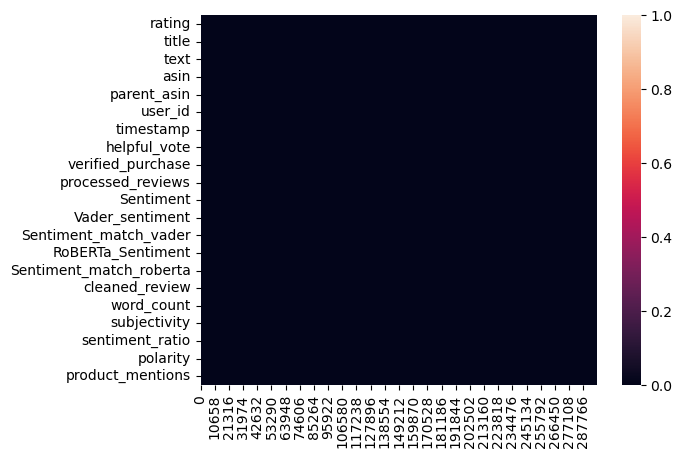

In [22]:
df.isnull().T.pipe(lambda df: (sns.heatmap(data = df)))

In [30]:
processed = df.dropna()

In [34]:
processed["parent_asin"].value_counts().head(10)

parent_asin
B0BMBC1FJX    620
B082L3QQCB    460
B0BFMLHG8K    456
B0BHRZYNTS    409
B0BNVLH8BF    403
B0BVZRV6GK    390
B0C2Q4V8TR    372
B001U8L8NO    365
B0BFDTYLT6    329
B0C4ZNVMMS    319
Name: count, dtype: int64

In [39]:
processed.describe(include = [np.number]).T

,count,mean,std,min,25%,50%,75%,max
rating,298244.0,3.002303,1.415220,1.0,2.000000,3.000000,4.000000,5.0
helpful_vote,298244.0,0.414640,1.857563,0.0,0.000000,0.000000,0.000000,466.0
Sentiment,298244.0,1.001529,0.894493,0.0,0.000000,1.000000,2.000000,2.0
Vader_sentiment,298244.0,1.337298,0.872274,0.0,0.000000,2.000000,2.000000,2.0
RoBERTa_Sentiment,298244.0,0.926587,0.905809,0.0,0.000000,1.000000,2.000000,2.0
word_count,298244.0,22.165341,24.842521,1.0,8.000000,15.000000,27.000000,1225.0
subjectivity,298244.0,0.472451,0.242451,0.0,0.357143,0.500000,0.622917,1.0
sentiment_ratio,298244.0,0.146439,0.280059,-1.0,0.000000,0.131000,0.316000,1.0
polarity,298244.0,0.135501,0.268546,-1.0,0.000000,0.114524,0.291384,1.0
product_mentions,298244.0,3.368826,4.038369,0.0,1.000000,2.000000,4.000000,135.0


In [41]:
processed.describe(include = object).T

,count,unique,top,freq
title,298244,205754,Disappointed,904
text,298244,294277,Good,126
asin,298244,107092,B0BMBC1FJX,620
parent_asin,298244,63815,B0BMBC1FJX,620
user_id,298244,254274,AH7OPR5CWTXCRWYECY34T62KA2QA,62
timestamp,298244,298240,2023-03-26 04:02:13.505000+00:00,2
processed_reviews,298244,294277,Good,126
cleaned_review,298244,289840,good,242


In [43]:
processed = processed.astype({"text":"category"})  

<Axes: xlabel='rating'>

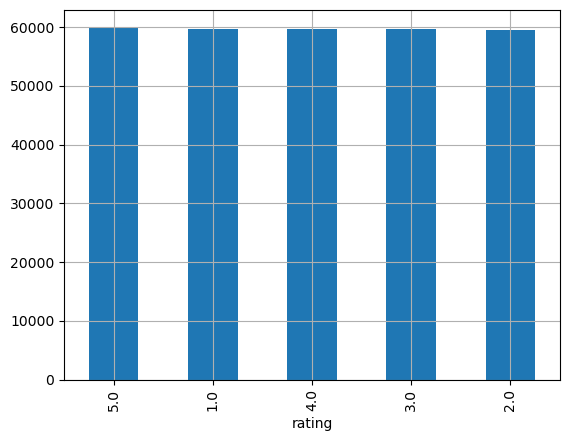

In [50]:
processed["rating"].value_counts().plot(kind = "bar" , grid = True)

/tmp/ipykernel_1555/2267115632.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(data = processed, x = "rating" , kind = "count", palette = "pastel")


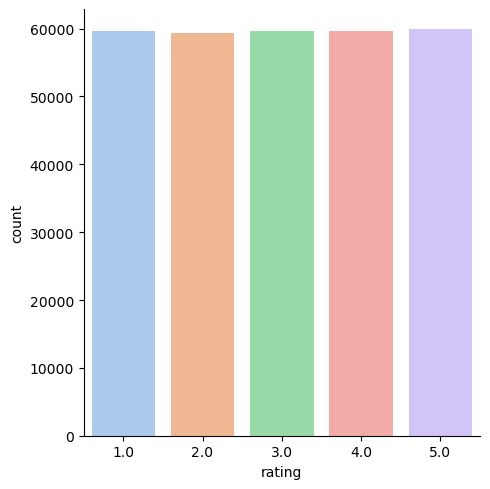

In [53]:
sns.catplot(data = processed, x = "rating" , kind = "count", palette = "pastel")

/tmp/ipykernel_1555/2521636924.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  processed.value_counts("rating", sort = True).reset_index(name = "count").pipe(lambda processed: sns.barplot(data = processed, x = "rating" , y = "count" , palette = "inferno"))


<Axes: xlabel='rating', ylabel='count'>

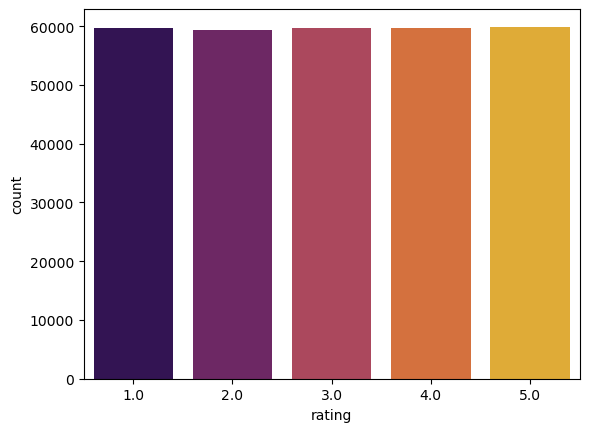

In [ ]:
processed.value_counts("rating", sort = True).reset_index(name = "count").pipe(lambda processed: sns.barplot(data = processed, x = "rating" , y = "count" , palette = "inferno"))

AttributeError: Rectangle.set() got an unexpected keyword argument 'multiples'

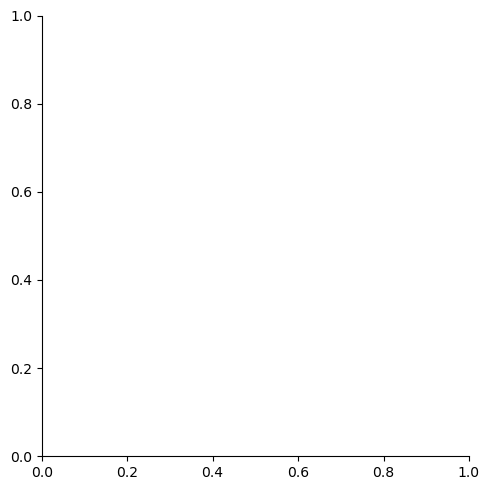

In [65]:
# Proporciones

processed.pipe(lambda processed: (sns.displot(data = processed , x = "rating" , hue = "rating", multiples = "fill" )))